In [ ]:
# path settings
import pandas as pd
import multiprocessing as mp
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import os
import sys
import pandas as pd

from gensim.models import TfidfModel
from gensim.matutils import corpus2dense, corpus2csc
import gensim
from gensim import corpora
from gensim.models import LdaModel

module_path='/export/gts_usuarios/lparbaiza/cnio'

if module_path not in sys.path:
    sys.path.append(module_path)

# set autoreload
%
_ext autoreload
%autoreload 2


rm -rf ~/.local/share/jupyter/runtime/*

In [2]:
import pickle
pkl_path = module_path+"/data/data_dic2025/profiles_per_sample_oncology_28_12_2025.pkl"

#pkl_path = module_path+"/data/data_aug2025/profiles_per_sample_finetune.pkl"


with open(pkl_path, "rb") as f:
    embedding_counts = pickle.load(f)

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f3fba743970>>
Traceback (most recent call last):
  File "/export/gts_usuarios/lparbaiza/cnio/env_cnio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


In [ ]:
model_type='a0' #a0; finetune
n = 30 # Tomamos un 'n' cualquiera
user_id=31001

print(embedding_counts[model_type].keys()) 

user_embed=embedding_counts[model_type][n][user_id]
print(embedding_counts[model_type][n].keys())  
print(len(embedding_counts[model_type][n].keys()))

dict_keys([5, 10, 15, 20, 25, 30])
dict_keys([11001, 11003, 11004, 11005, 11006, 11007, 11008, 11009, 11010, 11011, 12001, 12002, 12003, 12004, 12005, 12006, 12007, 13003, 13004, 13006, 13007, 13008, 13009, 13010, 21001, 21002, 22001, 22002, 22004, 23001, 23002, 23003, 23004, 23005, 23006, 23007, 23008, 23009, 23010, 23011, 23012, 23013, 23015, 31001, 31002, 31003, 31004, 31005, 31007, 31008, 31009, 31010, 31011, 31012, 31013, 31014, 31016, 41001, 41002, 41003, 41005, 41006, 41007, 41008, 41009, 41010, 41011, 41012, 41013, 41014, 41016, 41017, 41018, 41019, 41020, 41021, 41022, 41023, 41024, 41025, 41026, 41027, 41028, 42001, 42003, 51001, 51003, 51004, 51005, 51006, 51007, 51008, 51009, 51010, 51011, 51012, 51013, 51014, 51015, 51016, 52001, 52003, 52004, 52005, 53001, 53002, 53003, 61001, 61002, 61003, 61005, 61006, 62001, 62002, 62003, 62004, 62005, 63001, 63003, 63004, 63005, 63007, 71002, 71003, 71004, 71005, 71007, 71008, 71009, 71010, 71011, 71012, 72001, 73001, 73002, 73003, 73

In [ ]:
print(type(user_embed))  # Ver el tipo de dato (debe ser una tupla)
print(len(user_embed)) 
print(user_embed[0])

<class 'list'>
1
(815, array([167,  85, 154,  70,  22, 248, 149, 117, 115,  94, 103,  88,  63,
        11, 243,   6, 146, 209, 194, 117,  93, 146,  32,  12, 181,  35,
        74, 147,  43,  63, 120, 194,  51, 168,  92,  26,  78, 145, 135,
       176,  74,  93, 214,  92, 130, 184, 234, 213,  61,  78,   6,  92,
       110, 234, 231,  15, 145, 243,  43, 110, 102, 104, 231,   6, 120,
       226, 194, 240, 247, 117,  74,  67, 178,  70, 234, 148, 147, 188,
       228, 243, 110, 233,  26,  43,  62,  78,  78,  35, 218, 243, 193,
        94, 229,  67,   8,  14,  18, 243, 193, 231, 243, 110,  51, 228,
       192, 243, 193, 115, 110,  78, 188,  78, 243, 243, 193,  21,  70,
        18,  64, 145, 229,  93, 128, 110,  78, 188,  83,  67,  93, 240,
       142, 217, 243, 163,  62, 229,  81, 218, 145,  43, 193, 231, 243,
       142, 240,  43, 149, 188, 208, 243, 142, 113, 228, 231,  43, 243,
       117, 218,   5,  74, 193,  30, 208, 149, 218, 218, 125, 243, 243,
       216, 115,   5,   5,  74, 243, 100,

In [ ]:
print(len(user_embed))
for i, element in enumerate(user_embed[0]):
    print(f"Elemento {i} tiene tipo {type(element)} y tamaño {np.shape(element)}")
    
print(user_embed[0][0])
print(user_embed[0][1])
print(user_embed[0][2])
print(user_embed[0][3])

1
Elemento 0 tiene tipo <class 'int'> y tamaño ()
Elemento 1 tiene tipo <class 'numpy.ndarray'> y tamaño (815,)
Elemento 2 tiene tipo <class 'numpy.ndarray'> y tamaño (940,)
Elemento 3 tiene tipo <class 'pandas.core.series.Series'> y tamaño (815,)
Elemento 4 tiene tipo <class 'numpy.ndarray'> y tamaño (815,)
Elemento 5 tiene tipo <class 'numpy.ndarray'> y tamaño (815,)
Elemento 6 tiene tipo <class 'numpy.ndarray'> y tamaño (815,)
815
[167  85 154  70  22 248 149 117 115  94 103  88  63  11 243   6 146 209
 194 117  93 146  32  12 181  35  74 147  43  63 120 194  51 168  92  26
  78 145 135 176  74  93 214  92 130 184 234 213  61  78   6  92 110 234
 231  15 145 243  43 110 102 104 231   6 120 226 194 240 247 117  74  67
 178  70 234 148 147 188 228 243 110 233  26  43  62  78  78  35 218 243
 193  94 229  67   8  14  18 243 193 231 243 110  51 228 192 243 193 115
 110  78 188  78 243 243 193  21  70  18  64 145 229  93 128 110  78 188
  83  67  93 240 142 217 243 163  62 229  81 218 14

In [ ]:
import pandas as pd

# Lista para almacenar los datos
user_data = []

# Recorremos todos los usuarios en el modelo y 'n'
for user_id in embedding_counts[model_type][n].keys():
    user_embed = embedding_counts[model_type][n][user_id][0]
    
    # Extraemos el 'embedding_id' (que está en user_embed[1])
    embedding_ids = user_embed[1]  # Esto debería ser una lista o array de embedding_ids
    
    # Guardamos el user_id y su lista de embedding_ids en el arreglo
    user_data.append({
        'user_id': user_id,
        'embedding_ids': embedding_ids.tolist()  # Convertimos a lista si es un array
    })

# Crear un DataFrame con los datos
df = pd.DataFrame(user_data)

# Ver las primeras filas del DataFrame
print(df.head())

# Guardar el DataFrame en un archivo CSV
df.to_csv(module_path+"/data/eb2_profiles/user_embeddings_180patients_dec25.csv", index=False)


   user_id                                      embedding_ids
0    11001  [67, 34, 194, 7, 76, 49, 95, 62, 131, 175, 58,...
1    11003  [46, 13, 184, 225, 192, 224, 72, 224, 197, 180...
2    11004  [43, 43, 218, 210, 77, 34, 243, 125, 125, 218,...
3    11005  [238, 172, 50, 110, 125, 117, 18, 18, 149, 14,...
4    11006  [247, 69, 91, 142, 125, 208, 208, 15, 247, 51,...


In [ ]:


#df_datos_original = pd.read_csv(module_path+'/data/data_dic2025/daily_summary_PMP_lock_2025_09_11_with_extra_garmin.csv')
df_datos_original = pd.read_csv(module_path+"/data/eb2_profiles/user_embeddings_180patients_dec25.csv")
bbdd_primerrespuesta = pd.read_excel(module_path + "/data/data_dic2025/Base Matching.xlsx")


# 2. PREPARACIÓN Y RENOMBRAMIENTO
# Renombramos 'user' a 'ID' en df_datos_original para que coincida con la segunda tabla.
df_datos_original = df_datos_original.rename(columns={'user_id': 'ID'}, errors='ignore')
bbdd_primerrespuesta = bbdd_primerrespuesta.rename(columns={'S_RECORD_id': 'ID'})

# Convertir las columnas de ID a un tipo de dato consistente (ej. entero)
# Esto es crucial si los datos pueden tener formatos mixtos (números vs. strings).
df_datos_original['ID'] = pd.to_numeric(df_datos_original['ID'], errors='coerce').astype('Int64')
bbdd_primerrespuesta['ID'] = pd.to_numeric(bbdd_primerrespuesta['ID'], errors='coerce').astype('Int64')


# 3. ENCONTRAR IDs COMUNES (INTERSECCIÓN)
# Convertimos las columnas ID a conjuntos (sets) para encontrar la intersección rápidamente.
ids_original = set(df_datos_original['ID'].dropna().unique())
ids_respuesta = set(bbdd_primerrespuesta['ID'].dropna().unique())

# Realizar la intersección
ids_comunes = list(ids_original.intersection(ids_respuesta))

# 4. RESULTADO
print(f"Total de IDs únicos en df_datos_original: {len(ids_original)}")
print(f"Total de IDs únicos en bbdd_primerrespuesta: {len(ids_respuesta)}")
print(f"Total de IDs comunes (intersección): {len(ids_comunes)}")



Total de IDs únicos en df_datos_original: 175
Total de IDs únicos en bbdd_primerrespuesta: 126
Total de IDs comunes (intersección): 126


# Cargar bbdd con perfiles por paciente

In [2]:
df_datos_original = pd.read_csv(module_path + '/data/data_dic2025/daily_summary_PMP_lock_2025_09_11_with_extra_garmin.csv')  #daily_summary_PMP_lock_2025_09_11_with_extra_garmin daily_summary_eb2prod_dic25_enriched
# 1. Filtramos el usuario
datos_usuario_info = df_datos_original[df_datos_original['user'] == 61006].copy()

# 2. Convertimos la columna 'date' a formato datetime 
# (Esto asegura que el orden sea cronológico real y no alfabético)
datos_usuario_info['date_time'] = pd.to_datetime(datos_usuario_info['date_time'])

# 3. Ordenamos por fecha de forma creciente
datos_usuario_info = datos_usuario_info.sort_values(by='date_time', ascending=True)

# 4. Mostramos el resultado
datos_usuario_info

/tmp/ipykernel_8338/856019943.py:1: DtypeWarning: Columns (60) have mixed types. Specify dtype option on import or set low_memory=False.
  df_datos_original = pd.read_csv(module_path + '/data/data_dic2025/daily_summary_PMP_lock_2025_09_11_with_extra_garmin.csv')  #daily_summary_PMP_lock_2025_09_11_with_extra_garmin daily_summary_eb2prod_dic25_enriched


,user,date_time,service,oxygen_saturation_max_spo2,oxygen_saturation_max_spo2_ts,oxygen_saturation_min_spo2,oxygen_saturation_min_spo2_ts,oxygen_saturation_valid_measurements,oxygen_saturation_mean_spo2,activity_running,...,audio_speech_rate,audio_articulation_rate,audio_num_audios,audio_valence,audio_num_pauses,circadian_mesor,circadian_acrophase,circadian_amplitude,practiced_sport,weekend
50916,61006,2025-09-04,PMP_NAVARRA,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0
50917,61006,2025-09-05,PMP_NAVARRA,100.0,2025-09-05 11:23:00+00:00,78.0,2025-09-05 11:51:00+00:00,210.0,89.87,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0
50918,61006,2025-09-06,PMP_NAVARRA,97.0,2025-09-06 10:29:00+00:00,83.0,2025-09-06 11:04:00+00:00,194.0,89.44,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1
50919,61006,2025-09-07,PMP_NAVARRA,100.0,2025-09-07 08:35:00+00:00,82.0,2025-09-07 08:15:00+00:00,137.0,91.69,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
50920,61006,2025-09-08,PMP_NAVARRA,100.0,2025-09-08 11:10:00+00:00,87.0,2025-09-08 09:41:00+00:00,142.0,93.74,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0
50914,61006,2025-09-09,PMP_NAVARRA,97.0,2025-09-09 08:46:00+00:00,81.0,2025-09-09 11:42:00+00:00,184.0,87.16,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
50915,61006,2025-09-10,PMP_NAVARRA,100.0,2025-09-10 06:53:00+00:00,85.0,2025-09-10 07:02:00+00:00,17.0,93.41,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0


In [3]:
df_profiles= pd.read_csv(module_path+"/data/eb2_profiles/user_embeddings_180patients_dec25.csv") #user_embeddings_180patients_finetune
df_profiles = df_profiles.sort_values(by="user_id")
df_profiles

,user_id,embedding_ids
0,11001,"[67, 34, 194, 7, 76, 49, 95, 62, 131, 175, 58,..."
1,11003,"[46, 13, 184, 225, 192, 224, 72, 224, 197, 180..."
2,11004,"[43, 43, 218, 210, 77, 34, 243, 125, 125, 218,..."
3,11005,"[238, 172, 50, 110, 125, 117, 18, 18, 149, 14,..."
4,11006,"[247, 69, 91, 142, 125, 208, 208, 15, 247, 51,..."
...,...,...
170,91019,"[248, 168, 66, 8, 76, 72, 224, 243, 78, 40, 40..."
171,92001,"[141, 81, 81, 61, 229, 196, 122, 236, 81, 81, ..."
172,92002,"[24, 117, 165, 246, 250, 220, 45, 188, 85, 76,..."
173,93001,"[107, 77, 178, 48, 28, 1, 31, 109, 213, 136, 1..."


In [4]:
import ast

# 1. Convertimos el string de la columna a una lista real de Python
# Nota: Usamos ast.literal_eval porque es más seguro que 'eval'
df_profiles['embedding_len'] = df_profiles['embedding_ids'].apply(lambda x: len(ast.literal_eval(x)) if isinstance(x, str) else len(x))

usuario_info = df_profiles[df_profiles['user_id'] == 63003]
usuario_info


,user_id,embedding_ids,embedding_len
118,63003,"[204, 91, 161, 148, 169, 217, 150, 96, 21, 199...",24


# LDA

In [ ]:

import ast

def parse_if_needed(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val

df_profiles["embedding_ids"] = df_profiles["embedding_ids"].apply(parse_if_needed)

#documents = df["embedding_ids"].tolist()
documents = [[str(num) for num in doc] for doc in df_profiles["embedding_ids"]]  # Convertir números a strings
print(documents)
print(len(documents))

[['67', '34', '194', '7', '76', '49', '95', '62', '131', '175', '58', '10', '13', '32', '252', '12', '59', '8', '143', '149', '244', '104', '134', '50', '194', '165', '253', '100', '163', '118', '194', '76', '59', '109', '120', '12', '143', '194', '41', '158', '92', '193', '68', '243', '142', '16', '93', '11', '72', '72', '180', '59', '5', '59', '120', '96', '249', '76', '113', '5', '249', '143', '244', '96', '12', '50', '8', '129', '93', '134', '165', '180', '50', '128', '59', '120', '165', '249', '18', '50', '123', '59', '59', '134', '120', '19', '240', '250', '18', '149', '182', '200', '12', '50', '233', '73', '31', '200', '54', '59', '175', '59', '76', '129', '134', '68', '143', '5', '8', '59', '149', '134', '32', '59', '194', '50', '120', '76', '59', '31', '48', '113', '8', '224', '216', '12', '10', '192', '8', '8', '76', '224', '112', '12', '109', '210', '81', '100', '59', '11', '10', '13', '52', '50', '12', '57', '143', '59', '68', '113', '128', '59', '120', '12', '235', '19', '

In [ ]:
'''# 1. Convertimos embedding_ids en una lista de documentos (cada lista es un documento)
#documents = df["embedding_ids"].tolist()
#documents = [[str(num) for num in doc] for doc in documents]  # Convertir números a strings
# 2. Creamos un diccionario de términos (cada número se considera una palabra)

from gensim import corpora

dictionary = corpora.Dictionary(documents)

# 3. Convertimos los documentos en "Bag of Words" (BoW)
corpus = [dictionary.doc2bow(doc) for doc in documents]
#dictionary.save(module_path+"/2nd_phase/lda_models/dictionary_LDA_180patients.dict")

'''

In [ ]:
dictionary = corpora.Dictionary.load(module_path+"/2nd_phase/lda_models/dictionary_LDA_180patients.dict")
corpus = [dictionary.doc2bow(doc) for doc in documents]
print(dictionary.token2id)

{'10': 0, '100': 1, '104': 2, '105': 3, '107': 4, '108': 5, '109': 6, '11': 7, '110': 8, '112': 9, '113': 10, '118': 11, '119': 12, '12': 13, '120': 14, '121': 15, '123': 16, '125': 17, '128': 18, '129': 19, '13': 20, '131': 21, '132': 22, '133': 23, '134': 24, '136': 25, '140': 26, '142': 27, '143': 28, '146': 29, '149': 30, '153': 31, '155': 32, '158': 33, '16': 34, '160': 35, '161': 36, '165': 37, '166': 38, '168': 39, '17': 40, '172': 41, '173': 42, '175': 43, '177': 44, '178': 45, '179': 46, '18': 47, '180': 48, '182': 49, '184': 50, '185': 51, '187': 52, '19': 53, '191': 54, '192': 55, '193': 56, '194': 57, '198': 58, '199': 59, '2': 60, '20': 61, '200': 62, '204': 63, '206': 64, '209': 65, '21': 66, '210': 67, '211': 68, '212': 69, '214': 70, '216': 71, '218': 72, '22': 73, '220': 74, '224': 75, '225': 76, '226': 77, '228': 78, '229': 79, '23': 80, '231': 81, '233': 82, '234': 83, '237': 84, '240': 85, '243': 86, '244': 87, '245': 88, '249': 89, '251': 90, '252': 91, '253': 92, 

In [ ]:
print(len(corpus))
print(len(corpus[0]))
print(corpus[0])

175
141
[(0, 4), (1, 4), (2, 2), (3, 4), (5, 1), (6, 4), (7, 3), (8, 1), (9, 3), (10, 4), (11, 1), (12, 1), (13, 25), (14, 8), (15, 2), (16, 8), (17, 9), (18, 6), (19, 36), (20, 19), (21, 7), (23, 8), (24, 29), (25, 1), (26, 1), (27, 2), (28, 10), (29, 3), (30, 17), (31, 1), (32, 19), (33, 1), (34, 5), (35, 1), (37, 21), (39, 2), (40, 2), (41, 1), (42, 6), (43, 8), (44, 4), (45, 6), (47, 4), (48, 34), (49, 2), (50, 2), (51, 1), (52, 3), (53, 4), (54, 2), (55, 14), (56, 3), (57, 18), (60, 4), (61, 4), (62, 2), (64, 3), (65, 4), (67, 7), (68, 1), (69, 17), (70, 3), (71, 6), (72, 4), (73, 10), (74, 3), (75, 25), (76, 7), (77, 1), (78, 1), (80, 2), (81, 1), (82, 3), (83, 1), (84, 2), (85, 1), (86, 4), (87, 5), (88, 3), (89, 6), (91, 8), (92, 3), (93, 6), (94, 2), (95, 2), (96, 2), (97, 6), (98, 2), (99, 1), (100, 1), (101, 3), (102, 4), (104, 2), (106, 3), (107, 17), (108, 25), (109, 3), (111, 27), (112, 72), (113, 7), (115, 2), (116, 1), (117, 1), (118, 2), (119, 20), (120, 1), (121, 11),

In [ ]:


corpus_bow = [dictionary.doc2bow(doc) for doc in documents]

model = TfidfModel(corpus_bow)  

corpus_tfidf = model[corpus_bow]

n_tokens = len(dictionary)
num_docs = len(corpus_bow)
# Convert TFIDF representacion
corpus_tfidf_mat = corpus2dense(corpus_tfidf, num_terms=n_tokens, num_docs=num_docs)

In [ ]:
corpus_tfidf_mat.shape

(255, 175)

corpus_tfidf_mat.shape

## train lda model

In [ ]:
#lda_model = gensim.models.LdaMulticore(corpus_bow, num_topics=6, id2word = dictionary, passes=10000) # Utilizamos BOW en lugar de TF-IDF!
#lda_model.save(module_path+"/2nd_phase/lda_models/LDAvis_6topics_10000_180patients_notebook.gensim")

### Load

In [5]:
import ast
dictionary = corpora.Dictionary.load(module_path+"/2nd_phase/lda_models/dictionary_LDA_180patients_100000.dict")
print(dictionary.token2id)

df_profiles= pd.read_csv(module_path+"/data/eb2_profiles/user_embeddings_180patients_dec25.csv") #user_embeddings_180patients


def parse_if_needed(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val

df_profiles["embedding_ids"] = df_profiles["embedding_ids"].apply(parse_if_needed)

#documents = df["embedding_ids"].tolist()
documents = [[str(num) for num in doc] for doc in df_profiles["embedding_ids"]]  # Convertir números a strings
print(documents)
print(len(documents))


corpus_bow = [dictionary.doc2bow(doc) for doc in documents]

{'10': 0, '100': 1, '104': 2, '105': 3, '109': 4, '11': 5, '110': 6, '111': 7, '112': 8, '113': 9, '115': 10, '117': 11, '119': 12, '12': 13, '120': 14, '121': 15, '122': 16, '123': 17, '124': 18, '125': 19, '128': 20, '129': 21, '13': 22, '130': 23, '131': 24, '133': 25, '134': 26, '135': 27, '14': 28, '141': 29, '142': 30, '143': 31, '146': 32, '147': 33, '148': 34, '149': 35, '15': 36, '153': 37, '155': 38, '157': 39, '16': 40, '160': 41, '161': 42, '163': 43, '165': 44, '168': 45, '169': 46, '17': 47, '173': 48, '175': 49, '177': 50, '178': 51, '179': 52, '18': 53, '180': 54, '181': 55, '184': 56, '186': 57, '187': 58, '188': 59, '19': 60, '191': 61, '192': 62, '193': 63, '194': 64, '196': 65, '197': 66, '198': 67, '199': 68, '20': 69, '203': 70, '207': 71, '208': 72, '209': 73, '210': 74, '212': 75, '213': 76, '215': 77, '216': 78, '217': 79, '218': 80, '22': 81, '220': 82, '222': 83, '224': 84, '225': 85, '227': 86, '228': 87, '229': 88, '230': 89, '231': 90, '233': 91, '234': 92

In [6]:

#lda_model = LdaModel.load(module_path + "/2nd_phase/lda_models/LDAvis_6topics_100000_180patients.gensim") 
lda_model = LdaModel.load(module_path + "/2nd_phase/lda_models/LDAvis_6topics_100000_180patients_dec25.gensim") 




In [7]:


import pyLDAvis.gensim
pyLDAvis.enable_notebook()
data = pyLDAvis.gensim.prepare(lda_model, corpus_bow, dictionary)
#pyLDAvis.save_html(data, module_path+"/2nd_phase/lda_models/LDAvis_6topics_1000_136patients.html")


In [8]:
pyLDAvis.display(data)

In [9]:
import numpy as np
import pandas as pd

'''def get_top_terms_by_topic_lambda(lda_model, corpus, dictionary, lambda_val=0.6, top_n=10):
    """
    Calcula los top-N términos más relevantes por tópico según la fórmula de relevancia con lambda.
    """
    topic_term_dists = lda_model.get_topics()  # shape: (num_topics, vocab_size)
    num_topics, vocab_size = topic_term_dists.shape
    vocab = [dictionary[i] for i in range(vocab_size)]
    
    # Calcular frecuencia total de cada término
    term_frequency = np.zeros(vocab_size)
    for doc in corpus:
        for term_id, count in doc:
            term_frequency[term_id] += count
    term_proportion = term_frequency / term_frequency.sum()
    
    results = []
    
    for topic_idx in range(num_topics):
        topic_probs = topic_term_dists[topic_idx]
        relevance_scores = lambda_val * topic_probs + (1 - lambda_val) * (topic_probs / term_proportion)
        
        top_indices = relevance_scores.argsort()[::-1][:top_n]
        for rank, idx in enumerate(top_indices):
            results.append({
                'topic': topic_idx,
                'rank': rank + 1,
                'term': vocab[idx],
                'relevance': relevance_scores[idx]
            })
    
    return pd.DataFrame(results)'''
    
    
def get_top_terms_by_topic_lambda(lda_model, corpus, dictionary, lambda_val=0.6, top_n=10):
    """
    Calcula los top-N términos más relevantes por tópico según la fórmula de relevancia de pyLDAvis.
    """
    topic_term_dists = lda_model.get_topics()  # shape: (num_topics, vocab_size)
    num_topics, vocab_size = topic_term_dists.shape
    vocab = [dictionary[i] for i in range(vocab_size)]
    
    # Calcular la probabilidad marginal de cada término en el corpus (p(w))
    term_frequency = np.zeros(vocab_size)
    for doc in corpus:
        for term_id, count in doc:
            term_frequency[term_id] += count
    term_proportion = term_frequency / term_frequency.sum()

    results = []

    for topic_idx in range(num_topics):
        topic_probs = topic_term_dists[topic_idx]  # φ_kw

        # Evitar log(0)
        topic_probs = np.maximum(topic_probs, 1e-12)
        term_proportion_safe = np.maximum(term_proportion, 1e-12)

        # Fórmula de relevancia con log
        relevance_scores = (
            lambda_val * np.log(topic_probs) +
            (1 - lambda_val) * (np.log(topic_probs / term_proportion_safe))
        )

        top_indices = relevance_scores.argsort()[::-1][:top_n]
        for rank, idx in enumerate(top_indices):
            results.append({
                'topic': topic_idx,
                'rank': rank + 1,
                'profile': vocab[idx],
                'relevance': relevance_scores[idx]
            })

    return pd.DataFrame(results)

import matplotlib.pyplot as plt
import seaborn as sns


def plot_top_terms_by_topic_grid(df, top_n=10):
    """
    Dibuja los histogramas de términos más relevantes por tópico en una cuadrícula 2x3.
    """
    num_topics = df['topic'].nunique()
    n_cols = 3
    n_rows = (num_topics + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8))
    axes = axes.flatten()

    for topic_idx in range(num_topics):
        ax = axes[topic_idx]
        topic_data = df[df['topic'] == topic_idx].sort_values(by='probability', ascending=False).head(top_n)
        sns.barplot(
            x='probability', y='profile', data=topic_data,
            ax=ax, palette='mako', hue='profile', legend=False
        )
        ax.set_title(f"Tópico {topic_idx}", fontsize=10)
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelsize=8)
        ax.tick_params(axis='x', labelsize=8)

    # Ocultar subplots vacíos si hay menos de 6 tópicos
    for i in range(num_topics, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(pad=2.0)
    plt.show()

import numpy as np
# ... el resto de tu código

def get_top_terms_positive_probability(lda_model, corpus, dictionary, top_n=10):
    """
    Calcula los top-N términos por tópico y devuelve la P(w|k) en una escala positiva [0, 1].
    """
    topic_term_dists = lda_model.get_topics()  # Ya es la P(w|k), φ_kw
    num_topics, vocab_size = topic_term_dists.shape
    vocab = [dictionary[i] for i in range(vocab_size)]
    
    results = []
    
    for topic_idx in range(num_topics):
        topic_probs = topic_term_dists[topic_idx]  # Estos valores ya están en [0, 1]
        
        # Simplemente se ordenan por la probabilidad
        top_indices = topic_probs.argsort()[::-1][:top_n]
        
        for rank, idx in enumerate(top_indices):
            results.append({
                'topic': topic_idx,
                'rank': rank + 1,
                'profile': vocab[idx],
                'probability': topic_probs[idx]  # Valor positivo entre 0 y 1
            })
    
    return pd.DataFrame(results)

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def get_top_terms_by_topic_lambda(lda_model, corpus, dictionary, lambda_val=0.6, top_n=10):
    """
    Calculates the top-N most relevant terms per topic based on the pyLDAvis relevance formula.
    """
    topic_term_dists = lda_model.get_topics()  # shape: (num_topics, vocab_size)
    num_topics, vocab_size = topic_term_dists.shape
    vocab = [dictionary[i] for i in range(vocab_size)]
    
    # Calculate marginal probability of each term in the corpus (p(w))
    term_frequency = np.zeros(vocab_size)
    for doc in corpus:
        for term_id, count in doc:
            term_frequency[term_id] += count
    term_proportion = term_frequency / term_frequency.sum()

    results = []

    for topic_idx in range(num_topics):
        topic_probs = topic_term_dists[topic_idx]  # φ_kw

        # Avoid log(0)
        topic_probs = np.maximum(topic_probs, 1e-12)
        term_proportion_safe = np.maximum(term_proportion, 1e-12)

        # Relevance formula with log
        relevance_scores = (
            lambda_val * np.log(topic_probs) +
            (1 - lambda_val) * (np.log(topic_probs / term_proportion_safe))
        )

        top_indices = relevance_scores.argsort()[::-1][:top_n]
        for rank, idx in enumerate(top_indices):
            results.append({
                'topic': topic_idx,
                'rank': rank + 1,
                'profile': vocab[idx],
                'relevance': relevance_scores[idx]
            })

    return pd.DataFrame(results)

def get_top_terms_positive_probability(lda_model, corpus, dictionary, top_n=10):
    """
    Calculates the top-N terms per topic and returns P(w|k) on a positive scale [0, 1].
    """
    topic_term_dists = lda_model.get_topics()  # This is already P(w|k), φ_kw
    num_topics, vocab_size = topic_term_dists.shape
    vocab = [dictionary[i] for i in range(vocab_size)]
    
    results = []
    
    for topic_idx in range(num_topics):
        topic_probs = topic_term_dists[topic_idx]  # Values are already between 0 and 1
        
        # Sort by probability
        top_indices = topic_probs.argsort()[::-1][:top_n]
        
        for rank, idx in enumerate(top_indices):
            results.append({
                'topic': topic_idx,
                'rank': rank + 1,
                'profile': vocab[idx],
                'probability': topic_probs[idx]
            })
    
    return pd.DataFrame(results)

'''def plot_top_terms_by_topic_grid(df, top_n=10):
    """
    Plots histograms of the most relevant terms per topic in a 2x3 grid.
    """
    num_topics = df['topic'].nunique()
    n_cols = 3
    n_rows = (num_topics + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 9))
    # Add the main title requested
    fig.suptitle("Predominant Day Types per Pattern", fontsize=16, fontweight='bold', y=1.02)
    
    axes = axes.flatten()

    # Determine if we are plotting 'probability' or 'relevance'
    value_col = 'probability' if 'probability' in df.columns else 'relevance'

    for topic_idx in range(num_topics):
        ax = axes[topic_idx]
        topic_data = df[df['topic'] == topic_idx].sort_values(by=value_col, ascending=False).head(top_n)
        
        sns.barplot(
            x=value_col, y='profile', data=topic_data,
            ax=ax, palette='mako', hue='profile', legend=False
        )
        
        # Change "Tópico X" to "Pattern X" (starting from 1)
        ax.set_title(f"Pattern {topic_idx }", fontsize=12, fontweight='semibold')
        ax.set_xlabel(value_col.capitalize())
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelsize=9)
        ax.tick_params(axis='x', labelsize=9)

    # Hide empty subplots if there are fewer than the grid size
    for i in range(num_topics, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(pad=3.0)
    plt.show()'''
    
    
def plot_top_terms_by_topic_grid(df, top_n=10, save_path=None):
    """
    Plots histograms of the most relevant terms per topic in a 2x3 grid.
    Optionally saves the figure as an SVG file.
    """
    num_topics = df['topic'].nunique()
    n_cols = 3
    n_rows = (num_topics + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 9))
    # Add the main title
    fig.suptitle("Predominant Day Types per Pattern", fontsize=16, fontweight='bold', y=1.02)
    
    axes = axes.flatten()

    # Determine if we are plotting 'probability' or 'relevance'
    value_col = 'probability' if 'probability' in df.columns else 'relevance'

    for topic_idx in range(num_topics):
        ax = axes[topic_idx]
        topic_data = df[df['topic'] == topic_idx].sort_values(by=value_col, ascending=False).head(top_n)
        
        sns.barplot(
            x=value_col, y='profile', data=topic_data,
            ax=ax, palette='mako', hue='profile', legend=False
        )
        
        # Pattern X (starting from 0 or 1, adjusted to Pattern X as per your code)
        ax.set_title(f"Pattern {topic_idx}", fontsize=12, fontweight='semibold')
        ax.set_xlabel(value_col.capitalize())
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelsize=9)
        ax.tick_params(axis='x', labelsize=9)

    # Hide empty subplots
    for i in range(num_topics, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(pad=3.0)

    # --- Lógica de guardado ---
    if save_path:
        # Aseguramos que la carpeta exista
        folder = os.path.dirname(save_path)
        if folder and not os.path.exists(folder):
            os.makedirs(folder)
            
        # Guardamos en formato vectorial SVG
        fig.savefig(save_path, format='svg', bbox_inches='tight')
        print(f"Grid plot saved to: {save_path}")

    plt.show()

Relevance(w,t∣λ)=λ⋅p(w∣t)+(1−λ)⋅ 
p(w)
p(w∣t)
​	
 

Grid plot saved to: /export/gts_usuarios/lparbaiza/cnio/2nd_phase/results/topic_plots/top_terms_grid.svg


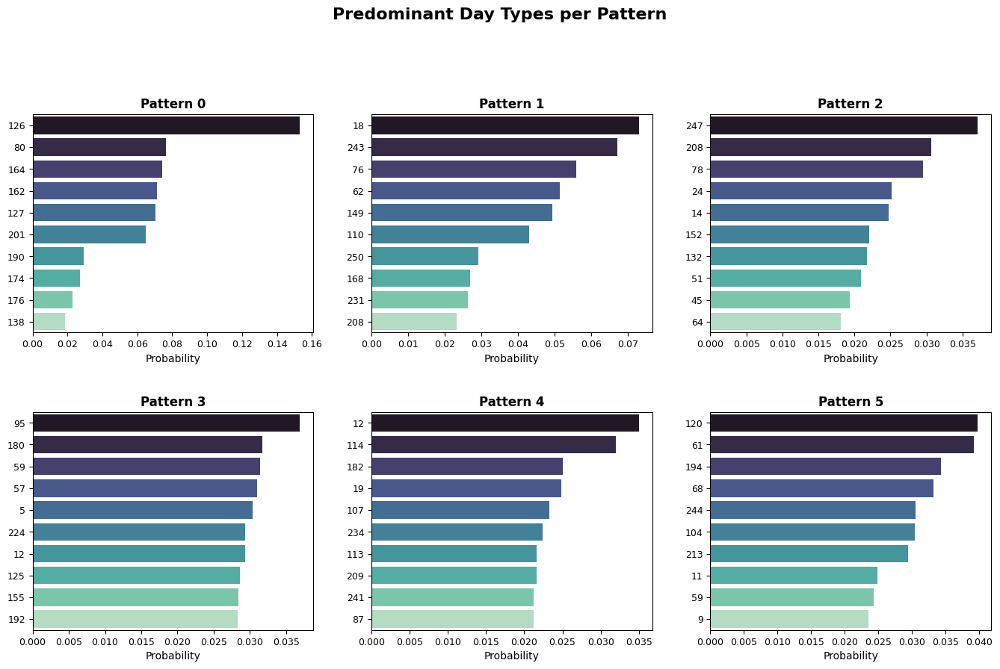

In [14]:

save_dir = os.path.join(module_path, "2nd_phase", "results", "topic_plots","top_terms_grid.svg")

terms_topic=get_top_terms_positive_probability(lda_model, corpus_bow, dictionary, top_n=10)
plot_top_terms_by_topic_grid(terms_topic, save_path=save_dir)

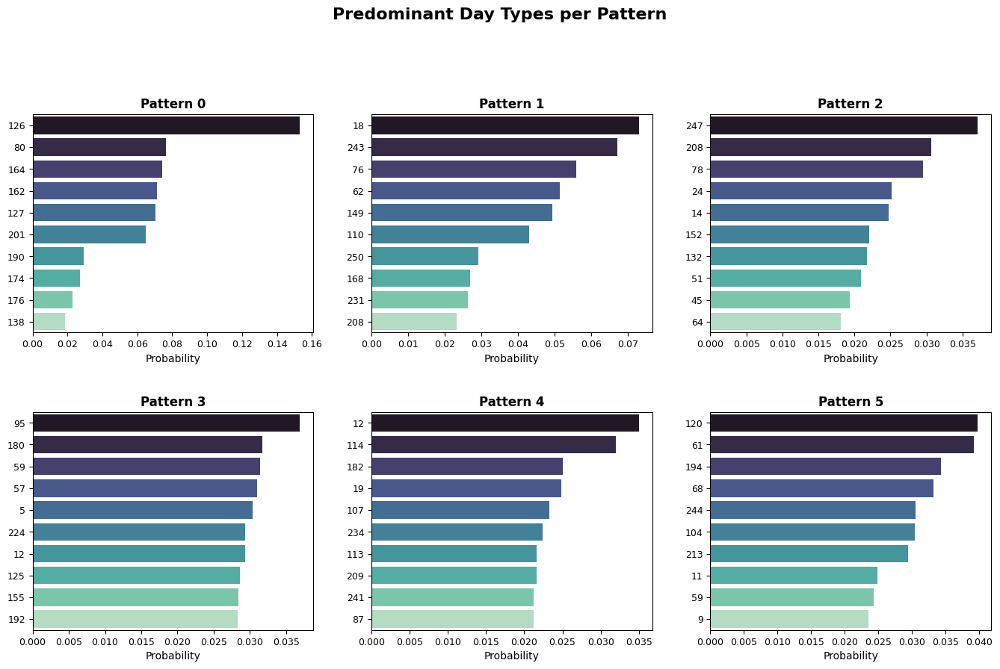

In [11]:
terms_topic=get_top_terms_positive_probability(lda_model, corpus_bow, dictionary, top_n=10)

plot_top_terms_by_topic_grid(terms_topic)

terms_topic=terms_topic[['topic','profile']]
terms_topic.to_csv(module_path+'/data/lda_topics/ldadic25_dic25_top10.csv',index=False)

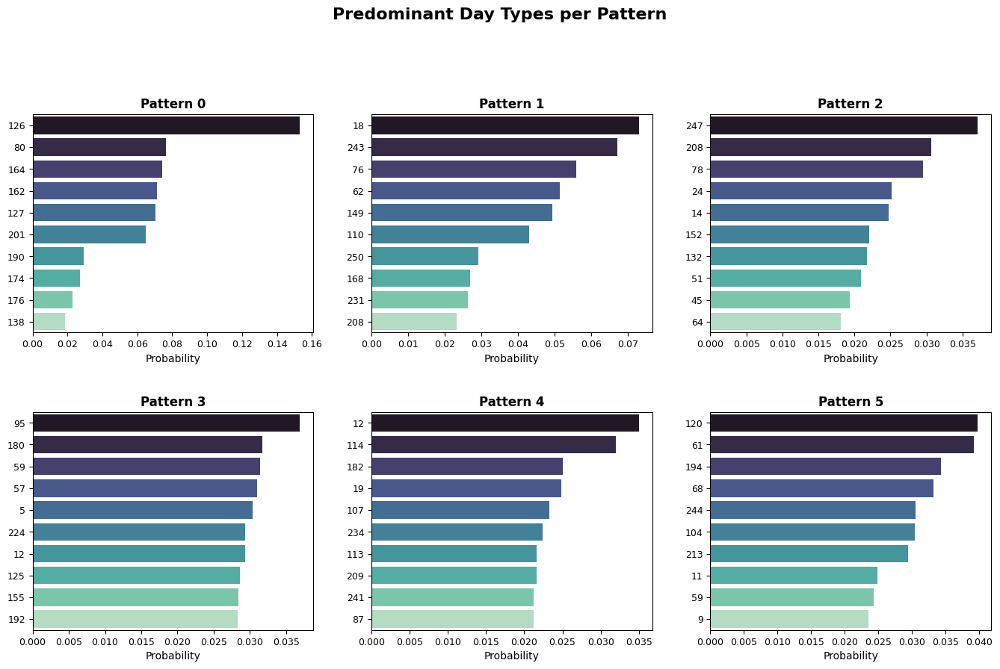

In [13]:
terms_topic=get_top_terms_positive_probability(lda_model, corpus_bow, dictionary, top_n=10)

plot_top_terms_by_topic_grid(terms_topic)

terms_topic=terms_topic[['topic','profile']]
terms_topic.to_csv(module_path+'/data/lda_topics/ldadic25_dic25_top10.csv',index=False)

# Cluster de topics

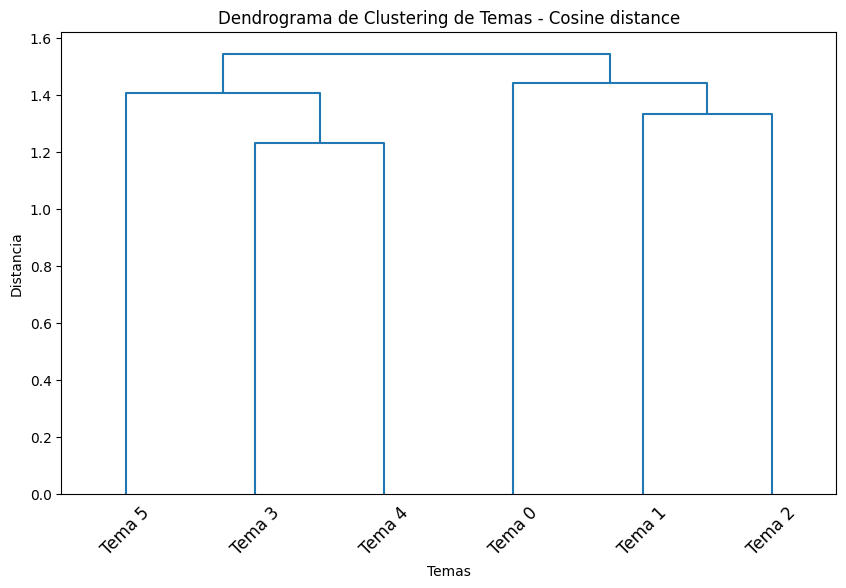

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics.pairwise import cosine_similarity

# Obtener las 10 palabras más importantes por tema
num_words = 10
topics = lda_model.show_topics(num_topics=10, num_words=num_words, formatted=False)

# Crear una matriz de términos (cada tema es un vector con las palabras como dimensiones)
word_list = list(set([word for topic in topics for word, _ in topic[1]]))  # Lista única de palabras
word_to_idx = {word: i for i, word in enumerate(word_list)}

# Crear una matriz de características para los temas
topic_vectors = np.zeros((len(topics), len(word_list)))

for i, (topic_id, topic) in enumerate(topics):
    for word, weight in topic:
        topic_vectors[i, word_to_idx[word]] = weight  # Asignar pesos a las palabras

# Calcular la similitud coseno entre los temas
similarity_matrix = cosine_similarity(topic_vectors)

# Aplicar clustering jerárquico
linked = linkage(similarity_matrix, method='ward')

# Graficar el dendrograma
plt.figure(figsize=(10, 6))
dendrogram(linked, labels=[f"Tema {i}" for i in range(len(topics))], leaf_rotation=45)
plt.title("Dendrograma de Clustering de Temas - Cosine distance")
plt.xlabel("Temas")
plt.ylabel("Distancia")
plt.show()


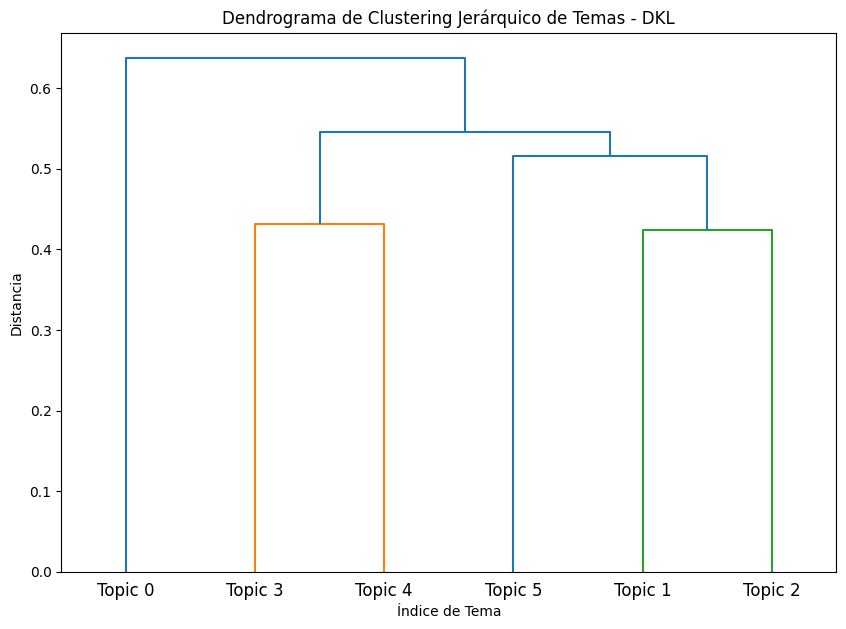

In [13]:
from scipy.spatial.distance import pdist, squareform
import scipy.cluster.hierarchy as sch
import scipy

# Paso 2: Obtener las distribuciones de palabras para cada tema
topic_word_distributions = lda_model.get_topics()  # Tamaño (num_topics x num_words)

# Paso 3: Función para calcular la divergencia de Jensen-Shannon (JS)
def jensen_shannon(P, Q):
    """Calcula la divergencia de Jensen-Shannon entre dos distribuciones P y Q"""
    M = 0.5 * (P + Q)  # Media de las distribuciones
    
    return 0.5 * (scipy.special.kl_div(P, M).sum() + scipy.special.kl_div(Q, M).sum())

# Paso 4: Calcular las divergencias entre todos los temas
num_topics = len(topic_word_distributions)
js_distances = np.zeros((num_topics, num_topics))

for i in range(num_topics):
    for j in range(i, num_topics):
        js_distance = jensen_shannon(topic_word_distributions[i], topic_word_distributions[j])
        js_distances[i, j] = js_distance
        js_distances[j, i] = js_distance  # La distancia es simétrica

# Paso 5: Hacer el clustering jerárquico
distance_matrix = squareform(js_distances)  # Convertimos la matriz de distancias en formato adecuado para el clustering

# Usamos el linkage para hacer clustering jerárquico
Z = sch.linkage(distance_matrix, method='ward')

# Paso 6: Mostrar el dendrograma
plt.figure(figsize=(10, 7))
sch.dendrogram(Z, labels=[f'Topic {i}' for i in range(num_topics)], orientation='top')
plt.title('Dendrograma de Clustering Jerárquico de Temas - DKL')
plt.xlabel('Índice de Tema')
plt.ylabel('Distancia')
plt.show()

## asignar id - cluster

In [14]:


topic_distributions = []
for i, bow in enumerate(corpus_bow):
    user_id = df_profiles.loc[i, "user_id"]
    # get_document_topics devuelve lista [(topic_id, probabilidad), ...]
    topics = lda_model.get_document_topics(bow, minimum_probability=0.0)  
    # convertir a dict para que quede más claro
    topic_probs = {f"topic_{tid}": prob for tid, prob in topics}
    topic_probs["user_id"] = user_id
    topic_distributions.append(topic_probs)

import pandas as pd
df_topics = pd.DataFrame(topic_distributions)
df_topics

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,user_id
0,0.000190,0.094893,0.000191,0.692382,0.017606,0.194739,11001
1,0.000478,0.056070,0.023020,0.670386,0.068693,0.181353,11003
2,0.000264,0.121457,0.514553,0.254527,0.082532,0.026667,11004
3,0.031426,0.720781,0.162115,0.000314,0.000315,0.085048,11005
4,0.000563,0.072492,0.632572,0.000568,0.293243,0.000563,11006
...,...,...,...,...,...,...,...
170,0.000902,0.763510,0.163613,0.000910,0.000903,0.070162,91019
171,0.000372,0.296752,0.152158,0.147149,0.082166,0.321403,92001
172,0.006425,0.238940,0.419105,0.006510,0.322533,0.006487,92002
173,0.001041,0.124034,0.174897,0.123733,0.498812,0.077484,93001


In [ ]:
from gensim.models import LdaModel
import pandas as pd


# 2. Obtener distribución de tópicos (lista de pares topic_id, probabilidad)
topic_distributions = [lda_model.get_document_topics(bow, minimum_probability=0.0) 
                       for bow in corpus_bow]

# 3. Número de tópicos en el modelo
num_topics = len(lda_model.get_topics())

# 4. Construir lista de distribuciones completas (vectores de probs)
topic_distributions_list = []
for doc in topic_distributions:
    topic_probs = [0] * num_topics
    for topic_id, prob in doc:
        topic_probs[topic_id] = prob
    topic_distributions_list.append(topic_probs)

# 5. Tema predominante por documento
predominant_topics = [max(doc, key=lambda x: x[1])[0] for doc in topic_distributions]

# 6. DataFrame de resultados
result_df = pd.DataFrame({
    'user_id': df_profiles['user_id'],
    'predominant_topic': predominant_topics,
    'topic_distribution': topic_distributions_list
})

# 7. Expandir topic_distribution en columnas
topic_columns = [f"topic_{i}" for i in range(num_topics)]
result_df[topic_columns] = pd.DataFrame(result_df['topic_distribution'].tolist(), 
                                        index=result_df.index)

result_df


,user_id,predominant_topic,topic_distribution,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5
0,11001,3,"[0.00019024033, 0.094892785, 0.00019086628, 0....",0.000190,0.094893,0.000191,0.692382,0.017605,0.194739
1,11003,3,"[0.00047766662, 0.056067478, 0.023019955, 0.67...",0.000478,0.056067,0.023020,0.670386,0.068694,0.181354
2,11004,2,"[0.00026418606, 0.12145818, 0.51455325, 0.2545...",0.000264,0.121458,0.514553,0.254527,0.082532,0.026666
3,11005,1,"[0.031426333, 0.7207797, 0.1621154, 0.00031404...",0.031426,0.720780,0.162115,0.000314,0.000315,0.085049
4,11006,2,"[0.0005627643, 0.072490364, 0.63257277, 0.0005...",0.000563,0.072490,0.632573,0.000568,0.293243,0.000563
...,...,...,...,...,...,...,...,...,...
170,91019,1,"[0.0009017797, 0.7635105, 0.16361338, 0.000910...",0.000902,0.763511,0.163613,0.000910,0.000903,0.070161
171,92001,5,"[0.00037217292, 0.29675072, 0.15215692, 0.1471...",0.000372,0.296751,0.152157,0.147150,0.082167,0.321403
172,92002,2,"[0.0064248946, 0.2389276, 0.4191231, 0.0065088...",0.006425,0.238928,0.419123,0.006509,0.322528,0.006487
173,93001,4,"[0.00104108, 0.12403497, 0.17489672, 0.1237319...",0.001041,0.124035,0.174897,0.123732,0.498813,0.077482


In [12]:
result_df.to_csv(module_path+"/data/eb2_profiles/user_topic_cluster_6topics_ldadic25_180patients_dic25.csv", index=False)

In [20]:

import pandas as pd
import numpy as np
import ast

# --- 1. CARGA DE DATOS ---
df_profiles = pd.read_csv(module_path + "/data/eb2_profiles/user_embeddings_180patients_dec25.csv")
bbdd_clinica = pd.read_excel(module_path + "/data/data_dic2025/Base con farmacos y covariables final.xlsx")

# --- 2. LIMPIEZA DE COLUMNAS (EL TRUCO PARA EVITAR EL KEYERROR) ---
# Esto elimina espacios en blanco al principio o al final de los nombres de las columnas
bbdd_clinica.columns = bbdd_clinica.columns.str.strip()

# Imprimimos para que tú mismo veas los nombres exactos que ha leído Python
print("Columnas detectadas en el Excel:", bbdd_clinica.columns.tolist())

# --- 3. RENOMBRADO Y PREPARACIÓN ---
result_df = result_df.rename(columns={'user_id': 'id', 'ID': 'id'}, errors='ignore')
df_profiles = df_profiles.rename(columns={'user_id': 'id', 'ID': 'id'}, errors='ignore')

# Renombramos el ID del Excel a 'id'
bbdd_clinica = bbdd_clinica.rename(columns={'S_RECORD_id': 'id'}, errors='ignore')

# Asegurar IDs numéricos
for df_tmp in [result_df, df_profiles, bbdd_clinica]:
    if 'id' in df_tmp.columns:
        df_tmp['id'] = pd.to_numeric(df_tmp['id'], errors='coerce').astype('Int64')

# Convertir embeddings a lista
df_profiles['embedding_ids'] = df_profiles['embedding_ids'].apply(ast.literal_eval)

# --- 4. MERGE TRIPLE ---

# Paso A: LDA + Profiles
df_master = pd.merge(result_df, df_profiles[['id', 'embedding_ids']], on='id', how='inner')

# Paso B: Unión con Clínica (Seleccionamos solo las que existen para que no falle)
cols_interes = ['id', 'Fecha_entrada_HDM', 'Evento PD', 'Tiempo Obs Final']
# Solo seleccionamos las columnas que realmente están en bbdd_clinica
cols_validas = [c for c in cols_interes if c in bbdd_clinica.columns]

df_final_unificada = pd.merge(
    df_master,
    bbdd_clinica[cols_validas],
    on='id',
    how='inner'
)

print(f"\n✅ Merge completado con éxito.")
print(f"Columnas finales: {df_final_unificada.columns.tolist()}")
# --- 5. GUARDADO Y VERIFICACIÓN ---

print(f"✅ Integración finalizada: {len(df_final_unificada)} pacientes procesados.")
print(f"Distribución clínica:\n{df_final_unificada['Evento PD'].value_counts() if 'Evento PD' in df_final_unificada.columns else 'N/A'}")

output_path = module_path + "/data/daily_&_targets/PD_cutoff_dic_2025s_eB2_Topics_a0_6topics100000.csv"
df_final_unificada.to_csv(output_path, index=False)

display(df_final_unificada)

Columnas detectadas en el Excel: ['S_RECORD_id', 'Fecha_entrada_HDM', 'Abandono Si/No', 'Evento PD', 'Tiempo Obs Final', 'Early PD', 'Fecha_Inicio_HDM', 'Cohorte', 'Group tumor', 'Edad', 'Raza', 'HEIGHT', 'PESO', 'IMC', 'Menopause', 'Menop', 'ECOG', 'Hemoglobina_g_dL_BASAL', 'Linfocitos_miles_mm3_BASAL', 'Neutrofilos_miles_mm3_BASAL', 'Plaquetas_miles_mm3_BASAL', 'Albumina_g_dL_BASAL', 'Fibrinogeno_mg_dL_BASAL', 'ProteinaCreactiva_mg_dL_BASAL', 'Corticoide', 'Beta_bloqueante', 'Opioide']

✅ Merge completado con éxito.
Columnas finales: ['id', 'predominant_topic', 'topic_distribution', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'embedding_ids', 'Fecha_entrada_HDM', 'Evento PD', 'Tiempo Obs Final']
✅ Integración finalizada: 175 pacientes procesados.
Distribución clínica:
Evento PD
0.0    112
1.0     62
Name: count, dtype: int64


,id,predominant_topic,topic_distribution,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,embedding_ids,Fecha_entrada_HDM,Evento PD,Tiempo Obs Final
0,11001,3,"[0.00019024033, 0.094892785, 0.00019086628, 0....",0.000190,0.094893,0.000191,0.692382,0.017605,0.194739,"[67, 34, 194, 7, 76, 49, 95, 62, 131, 175, 58,...",2023-04-19,0.0,876
1,11003,3,"[0.00047766662, 0.056067478, 0.023019955, 0.67...",0.000478,0.056067,0.023020,0.670386,0.068694,0.181354,"[46, 13, 184, 225, 192, 224, 72, 224, 197, 180...",2023-12-05,1.0,357
2,11004,2,"[0.00026418606, 0.12145818, 0.51455325, 0.2545...",0.000264,0.121458,0.514553,0.254527,0.082532,0.026666,"[43, 43, 218, 210, 77, 34, 243, 125, 125, 218,...",2023-12-20,0.0,631
3,11005,1,"[0.031426333, 0.7207797, 0.1621154, 0.00031404...",0.031426,0.720780,0.162115,0.000314,0.000315,0.085049,"[238, 172, 50, 110, 125, 117, 18, 18, 149, 14,...",2024-03-27,0.0,533
4,11006,2,"[0.0005627643, 0.072490364, 0.63257277, 0.0005...",0.000563,0.072490,0.632573,0.000568,0.293243,0.000563,"[247, 69, 91, 142, 125, 208, 208, 15, 247, 51,...",2024-11-20,0.0,295
...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,91019,1,"[0.0009017797, 0.7635105, 0.16361338, 0.000910...",0.000902,0.763511,0.163613,0.000910,0.000903,0.070161,"[248, 168, 66, 8, 76, 72, 224, 243, 78, 40, 40...",2025-03-12,0.0,183
171,92001,5,"[0.00037217292, 0.29675072, 0.15215692, 0.1471...",0.000372,0.296751,0.152157,0.147150,0.082167,0.321403,"[141, 81, 81, 61, 229, 196, 122, 236, 81, 81, ...",2024-07-18,1.0,448
172,92002,2,"[0.0064248946, 0.2389276, 0.4191231, 0.0065088...",0.006425,0.238928,0.419123,0.006509,0.322528,0.006487,"[24, 117, 165, 246, 250, 220, 45, 188, 85, 76,...",2024-09-06,1.0,28
173,93001,4,"[0.00104108, 0.12403497, 0.17489672, 0.1237319...",0.001041,0.124035,0.174897,0.123732,0.498813,0.077482,"[107, 77, 178, 48, 28, 1, 31, 109, 213, 136, 1...",2023-12-07,1.0,163


# Merge survival - lda topics

In [13]:
'''df_day=pd.read_csv(module_path+"/data/eb2_profiles/user_topic_cluster_6topics_2cluster_lda100000_136patients.csv")  #daily_summary_eb2prod-3
df_res = pd.read_excel(module_path+'/data/2024_23_CNIO_100/Dias_PD_cutoff_enero_2025.xlsx')'''

df_day=pd.read_csv(module_path+"/data/eb2_profiles/user_topic_cluster_6topics_ldadic25_180patients_dic25.csv")  # user_topic_cluster_6topics_lda100000_180patients_dic25

df_res = pd.read_excel(module_path + "/data/data_dic2025/Base con farmacos y covariables final.xlsx")


df_res

,S_RECORD_id,Fecha_entrada_HDM,Abandono Si/No,Evento PD,Tiempo Obs Final,Early PD,Fecha_Inicio_HDM,Cohorte,Group tumor,Edad,...,Hemoglobina_g_dL_BASAL,Linfocitos_miles_mm3_BASAL,Neutrofilos_miles_mm3_BASAL,Plaquetas_miles_mm3_BASAL,Albumina_g_dL_BASAL,Fibrinogeno_mg_dL_BASAL,ProteinaCreactiva_mg_dL_BASAL,Corticoide,Beta_bloqueante,Opioide
0,11001,2023-04-19,No,0.0,876,0,2023-04-19,Breast,1,55.0,...,15.1,2.95,4.81,297.0,3.95,447.0,0.16,1.0,0.0,0.0
1,11003,2023-12-05,No,1.0,357,0,2023-12-05,Breast,1,55.0,...,14.9,1.30,3.70,192.0,4.81,NaN,NaN,1.0,0.0,1.0
2,11004,2023-12-20,No,0.0,631,0,2023-12-20,Breast,1,54.0,...,12.3,2.96,3.62,241.0,NaN,NaN,NaN,0.0,0.0,0.0
3,11005,2024-03-27,No,0.0,533,0,2024-03-27,Breast,1,51.0,...,15.2,2.15,2.86,237.0,4.42,NaN,NaN,1.0,0.0,0.0
4,11006,2024-11-20,No,0.0,295,0,2024-11-20,Breast,1,51.0,...,10.5,2.83,3.71,318.0,4.10,NaN,NaN,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,92001,2024-07-18,No,1.0,448,0,2024-07-18,Colorectal,2,52.0,...,11.9,2.20,5.10,431.0,4.27,NaN,NaN,0.0,0.0,0.0
174,92002,2024-09-06,No,1.0,28,1,2024-09-06,Colorectal,2,59.0,...,11.9,2.55,7.96,323.0,3.40,NaN,0.57,0.0,0.0,1.0
175,93001,2023-12-07,No,1.0,163,1,2023-12-07,Lung,3,50.0,...,12.8,1.13,61.50,176.0,4.30,NaN,NaN,1.0,1.0,1.0
176,93002,2024-07-23,No,0.0,415,0,2024-07-23,Lung,3,71.0,...,13.8,2.04,8.63,185.0,NaN,NaN,NaN,1.0,1.0,0.0


In [14]:
df_day.head()

,user_id,predominant_topic,topic_distribution,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5
0,11001,3,"[0.00019024033, 0.094892785, 0.00019086628, 0....",0.000190,0.094893,0.000191,0.692382,0.017605,0.194739
1,11003,3,"[0.00047766662, 0.056067478, 0.023019955, 0.67...",0.000478,0.056067,0.023020,0.670386,0.068694,0.181354
2,11004,2,"[0.00026418606, 0.12145818, 0.51455325, 0.2545...",0.000264,0.121458,0.514553,0.254527,0.082532,0.026666
3,11005,1,"[0.031426333, 0.7207797, 0.1621154, 0.00031404...",0.031426,0.720780,0.162115,0.000314,0.000315,0.085049
4,11006,2,"[0.0005627643, 0.072490364, 0.63257277, 0.0005...",0.000563,0.072490,0.632573,0.000568,0.293243,0.000563


In [15]:

if module_path not in sys.path:
    sys.path.append(module_path)


'''df_day=pd.read_csv(module_path+"/data/eb2_profiles/user_topic_cluster_6topics_2cluster_lda100000_136patients.csv")  #daily_summary_eb2prod-3
df_res = pd.read_excel(module_path+'/data/2024_23_CNIO_100/Dias_PD_cutoff_enero_2025.xlsx')'''
save_name='PD_cutoff_dic_2025s_eB2_Topics_a0_6topics100000_ldadic25'


import pandas as pd
df_res.rename(columns={'S_RECORD_id': 'id'}, inplace=True)
df_day.rename(columns={'user_id': 'id'}, inplace=True)

df_res['id'] = pd.to_numeric(df_res['id'],errors='coerce').astype('Int64')
df_day['id'] = pd.to_numeric(df_day['id'],errors='coerce').astype('Int64')


df_unido = pd.merge(df_day, df_res, on='id', how='inner')
print(df_unido.columns)

# Imprimir los 'id' comunes
common_ids = df_unido['id'].unique()  # Extraer los 'id' únicos
print("IDs comunes entre ambas bases de datos:",len(common_ids))
print(common_ids)

# Encontrar los 'id' no comunes
# Los 'id' no comunes están en df_day pero no en df_res y viceversa
ids_in_df_day_not_in_res = df_day[~df_day['id'].isin(df_res['id'])]['id'].unique()
ids_in_df_res_not_in_day = df_res[~df_res['id'].isin(df_day['id'])]['id'].unique()

# Imprimir los 'id' no comunes
print("\nIDs que están en df_day pero no en df_res:",len(ids_in_df_day_not_in_res))
print(ids_in_df_day_not_in_res)

print("\nIDs que están en df_res pero no en df_day:",len(ids_in_df_res_not_in_day))
print(ids_in_df_res_not_in_day)

df_unido.to_csv(module_path+'/data/daily_&_targets/'+save_name+'.csv',index=False)
print('Merged db saved: ',module_path+'/data/daily_&_targets/'+save_name+'.csv' )

Index(['id', 'predominant_topic', 'topic_distribution', 'topic_0', 'topic_1',
       'topic_2', 'topic_3', 'topic_4', 'topic_5', 'Fecha_entrada_HDM',
       'Abandono Si/No', 'Evento PD', 'Tiempo Obs Final ', 'Early PD',
       'Fecha_Inicio_HDM', 'Cohorte', 'Group tumor', 'Edad', 'Raza', 'HEIGHT',
       'PESO', 'IMC', 'Menopause', 'Menop', 'ECOG', 'Hemoglobina_g_dL_BASAL',
       'Linfocitos_miles_mm3_BASAL', 'Neutrofilos_miles_mm3_BASAL',
       'Plaquetas_miles_mm3_BASAL', 'Albumina_g_dL_BASAL',
       'Fibrinogeno_mg_dL_BASAL', 'ProteinaCreactiva_mg_dL_BASAL',
       'Corticoide', 'Beta_bloqueante', 'Opioide'],
      dtype='object')
IDs comunes entre ambas bases de datos: 175
<IntegerArray>
[11001, 11003, 11004, 11005, 11006, 11007, 11008, 11009, 11010, 11011,
 ...
 91014, 91015, 91016, 91017, 91018, 91019, 92001, 92002, 93001, 93002]
Length: 175, dtype: Int64

IDs que están en df_day pero no en df_res: 0
<IntegerArray>
[]
Length: 0, dtype: Int64

IDs que están en df_res pero no e

In [16]:
#save_name='PD_cutoff_dic_2025s_eB2_Topics_a0_6topics100000_180patients'
save_name='PD_cutoff_dic_2025s_eB2_Topics_a0_6topics100000_ldadic25'

df_unido=pd.read_csv(module_path+'/data/daily_&_targets/'+save_name+'.csv')


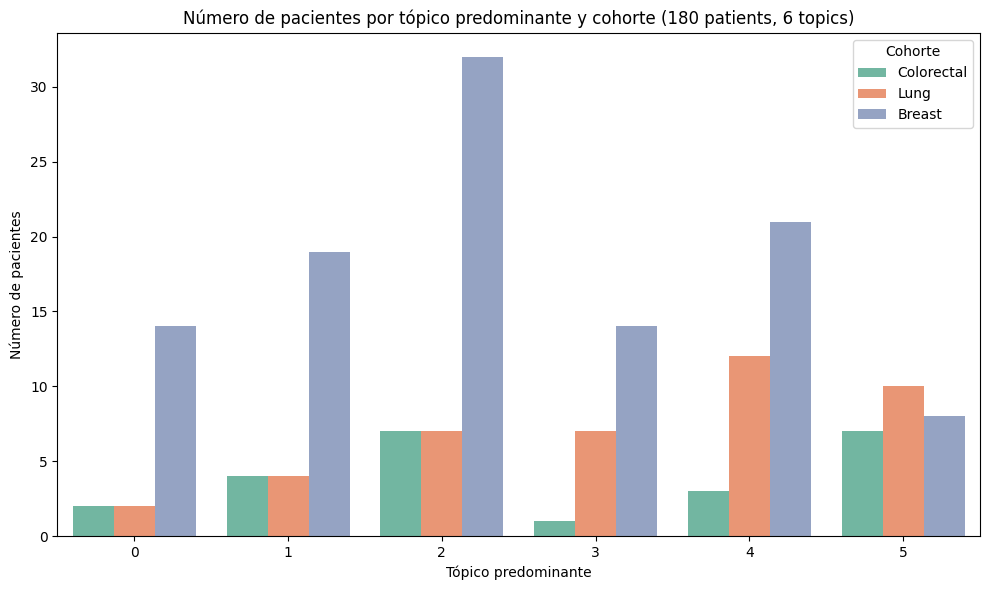

In [25]:
def plot_patients_by_cohort_and_topic(df, npatients= 180,n_topic=6,save_dir=None, filename="patients_by_topic.png"):
    """
    Histograma del número de pacientes por cohorte según el tópico predominante.
    """
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='predominant_topic', hue='Cohorte', palette='Set2')

    plt.title(f'Número de pacientes por tópico predominante y cohorte ({npatients} patients, {n_topic} topics)')
    plt.xlabel('Tópico predominante')
    plt.ylabel('Número de pacientes')
    plt.legend(title='Cohorte')
    plt.tight_layout()

    # Guardar si se especifica directorio
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)  # crea el directorio si no existe
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"Gráfico guardado en: {save_path}")

    plt.show()

    
#plot_patients_by_cohort_and_topic(df_unido, npatients= 180,n_topic=6,save_dir=module_path+'/2nd_phase/results/topic_plots',filename="patients_by_topic_180p_6lda100000.png")
plot_patients_by_cohort_and_topic(df_unido, npatients= 180,n_topic=6)

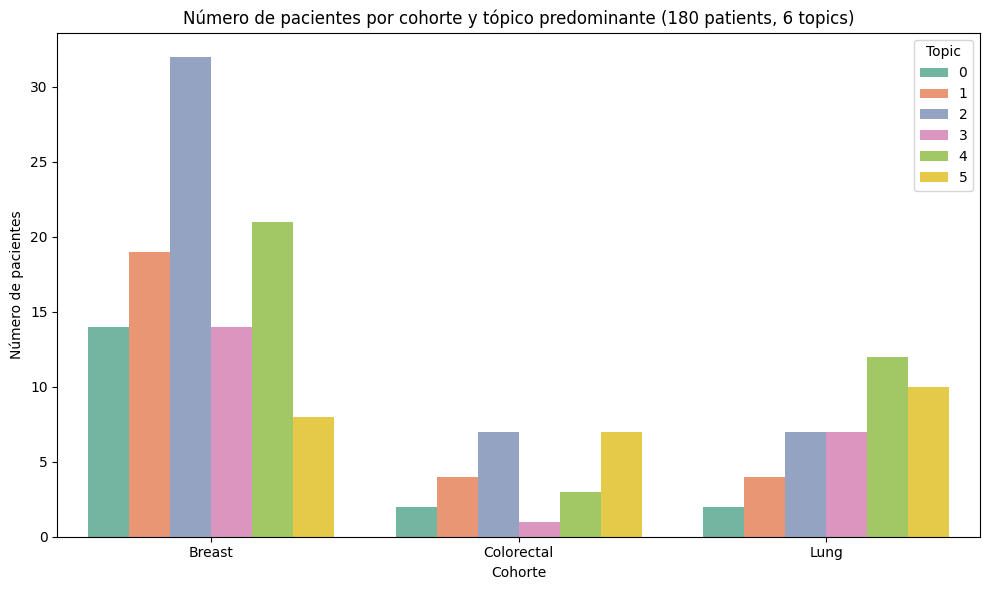

In [26]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

def plot_patients_by_cohort_and_topic(df,n_topic=6, npatients=None, save_dir=None, filename="patients_by_cohort.png"):
    """
    Histograma del número de pacientes por cohorte según el tópico predominante.
    """
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='Cohorte', hue='predominant_topic', palette='Set2')

    # título dinámico
    if npatients is not None:
        plt.title(f'Número de pacientes por cohorte y tópico predominante ({npatients} patients, {n_topic} topics)')
    else:
        plt.title('Número de pacientes por cohorte y tópico predominante')

    plt.xlabel('Cohorte')
    plt.ylabel('Número de pacientes')
    plt.legend(title='Topic')
    plt.tight_layout()

    # Guardar si se especifica directorio
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)  # crea el directorio si no existe
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"Gráfico guardado en: {save_path}")

    plt.show()

# ejemplo de uso
'''plot_patients_by_cohort_and_topic(
    df_unido,
    npatients=180,
    n_topic=6,
    save_dir=os.path.join(module_path, "2nd_phase", "results", "topic_plots"),
    filename="patients_by_cohort_180p_6lda100000.png"
)'''

plot_patients_by_cohort_and_topic(
    df_unido,
    npatients=180,
    n_topic=6)

In [27]:
display(df_unido[['id', 'predominant_topic', 'topic_distribution', 'topic_0', 'topic_1',
       'topic_2', 'topic_3', 'topic_4', 'topic_5', 'Fecha_entrada_HDM',
       'Abandono Si/No', 'Evento PD', 'Tiempo Obs Final ', 'Early PD',
       'Fecha_Inicio_HDM', 'Cohorte', 'Group tumor']])

,id,predominant_topic,topic_distribution,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,Fecha_entrada_HDM,Abandono Si/No,Evento PD,Tiempo Obs Final,Early PD,Fecha_Inicio_HDM,Cohorte,Group tumor
0,11001,3,"[0.00019024035, 0.09489259, 0.0001908663, 0.69...",0.000190,0.094893,0.000191,0.692381,0.017606,0.194739,2023-04-19,No,0.0,876,0,2023-04-19,Breast,1
1,11003,3,"[0.00047766665, 0.056070484, 0.023020264, 0.67...",0.000478,0.056070,0.023020,0.670386,0.068693,0.181353,2023-12-05,No,1.0,357,0,2023-12-05,Breast,1
2,11004,2,"[0.00026418606, 0.12145929, 0.51455253, 0.2545...",0.000264,0.121459,0.514553,0.254526,0.082532,0.026665,2023-12-20,No,0.0,631,0,2023-12-20,Breast,1
3,11005,1,"[0.03142639, 0.72078127, 0.16211456, 0.0003140...",0.031426,0.720781,0.162115,0.000314,0.000315,0.085048,2024-03-27,No,0.0,533,0,2024-03-27,Breast,1
4,11006,2,"[0.0005627643, 0.072493784, 0.6325705, 0.00056...",0.000563,0.072494,0.632571,0.000568,0.293242,0.000563,2024-11-20,No,0.0,295,0,2024-11-20,Breast,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,91019,1,"[0.0009017797, 0.7635094, 0.16361015, 0.000910...",0.000902,0.763509,0.163610,0.000910,0.000903,0.070166,2025-03-12,No,0.0,183,0,2025-03-12,Breast,1
170,92001,5,"[0.00037217283, 0.29675895, 0.15214796, 0.1471...",0.000372,0.296759,0.152148,0.147143,0.082178,0.321400,2024-07-18,No,1.0,448,0,2024-07-18,Colorectal,2
171,92002,2,"[0.006424894, 0.2389487, 0.41909257, 0.0065103...",0.006425,0.238949,0.419093,0.006510,0.322536,0.006487,2024-09-06,No,1.0,28,1,2024-09-06,Colorectal,2
172,93001,4,"[0.0010410799, 0.12403185, 0.17489712, 0.12373...",0.001041,0.124032,0.174897,0.123734,0.498810,0.077486,2023-12-07,No,1.0,163,1,2023-12-07,Lung,3


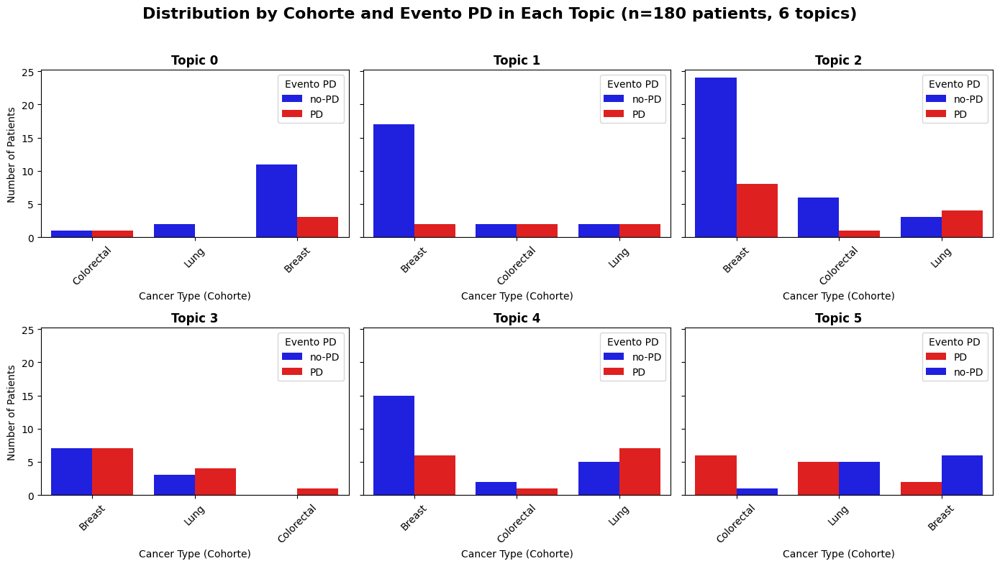

In [28]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cancer_type_by_topic_and_event(df, event_col="Evento PD", n_topic=6, npatients=None, save_dir=None, filename="cancer_type_by_topic.png"):
    """
    Para cada tópico, muestra un histograma de tipos de cáncer (Cohorte),
    separado por el evento clínico especificado en 'event_col'.
    """
    df = df.copy()
    
    # Creamos etiquetas legibles basadas en la columna que tú elijas
    # Usamos .astype(float) para asegurar que el mapeo funcione con 0.0 y 1.0
    df['Event_label'] = df[event_col].astype(float).map({0.0: 'no-PD', 1.0: 'PD'})
    
    # Obtenemos la lista de tópicos únicos ordenados
    topics = sorted(df['predominant_topic'].unique())
    num_topics = len(topics)
    
    n_cols = 3
    n_rows = (num_topics + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4 * n_rows), sharey=True)
    axes = axes.flatten()

    custom_palette = {'PD': 'red', 'no-PD': 'blue'}

    for i, topic in enumerate(topics):
        ax = axes[i]
        subset = df[df['predominant_topic'] == topic]
        
        sns.countplot(
            data=subset, x='Cohorte', hue='Event_label',
            palette=custom_palette, ax=ax
        )
        
        ax.set_title(f'Topic {topic}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Cancer Type (Cohorte)')
        ax.set_ylabel('Number of Patients')
        ax.tick_params(axis='x', rotation=45)
        ax.legend(title=event_col)

    # Eliminar subplots vacíos
    for i in range(num_topics, len(axes)):
        fig.delaxes(axes[i])

    # Título dinámico
    title_text = f"Distribution by Cohorte and {event_col} in Each Topic"
    if npatients:
        title_text += f" (n={npatients} patients, {n_topic} topics)"
    
    fig.suptitle(title_text, fontsize=16, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Guardar si se especifica
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✅ Gráfico guardado en: {save_path}")

    plt.show()

# --- Ejemplo de uso con tu nueva columna ---
plot_cancer_type_by_topic_and_event(
    df_unido, # Tu base de datos unificada
    event_col="Evento PD", # El nombre de la columna que quieres mirar
    n_topic=6,
    npatients=180
)

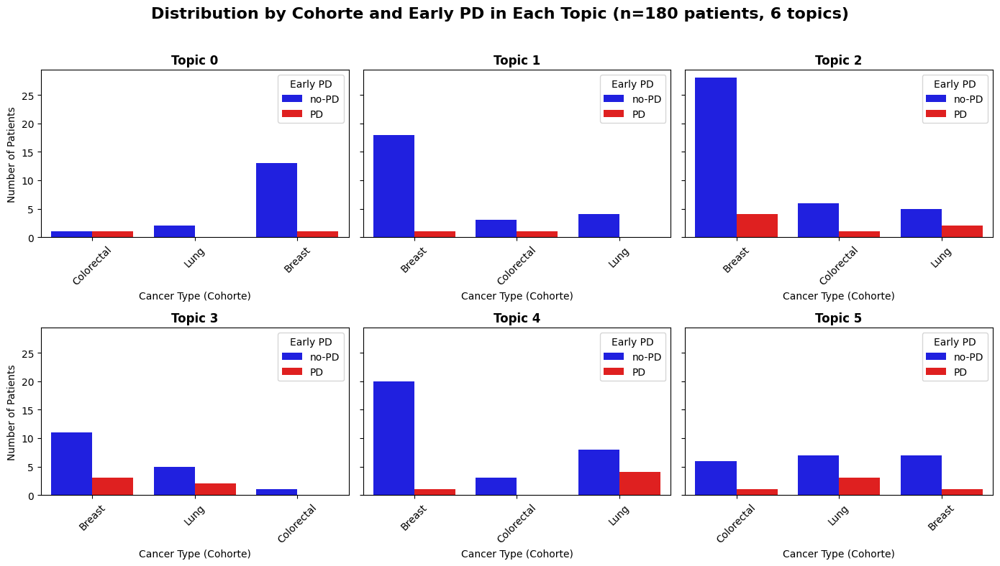

In [29]:
plot_cancer_type_by_topic_and_event(
    df_unido, # Tu base de datos unificada
    event_col="Early PD", # El nombre de la columna que quieres mirar
    n_topic=6,
    npatients=180
)

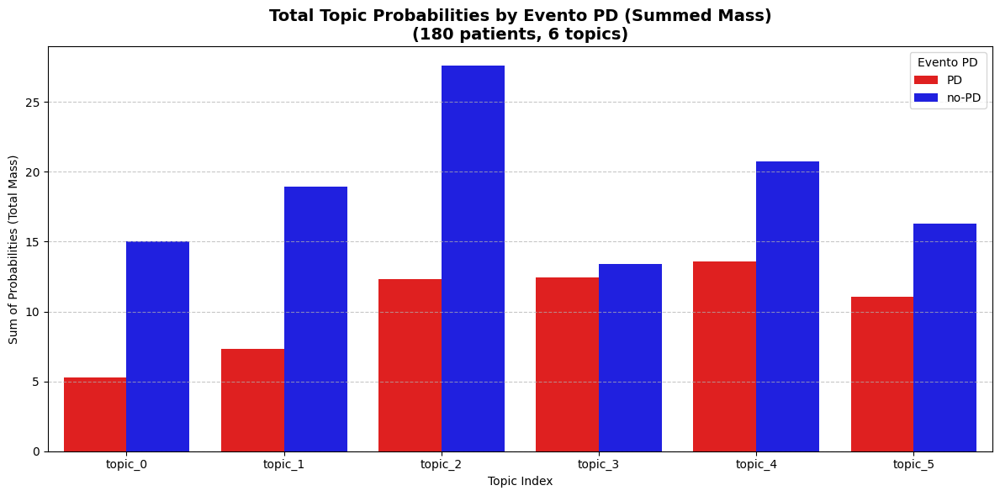

In [30]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_topic_probabilities_by_event(df, topic_cols, event_col="Evento PD", npatients=None,
                                      save_dir=None, filename="topic_probs_by_event.png"):
    """
    Para cada tópico, muestra la masa total de probabilidad contribuida por los pacientes,
    separada por el evento clínico (PD vs no-PD).
    """
    df = df.copy()
    
    # Creamos etiquetas basadas en la columna dinámica
    # Convertimos a float para manejar casos de 0.0/1.0 del Excel
    df['Event_label'] = df[event_col].astype(float).map({0.0: 'no-PD', 1.0: 'PD'})

    # --- Reshape: pasamos de formato ancho a largo para seaborn ---
    # Cada fila será: [id, Event_label, Topic_Name, Probability_Value]
    df_melted = df.melt(id_vars=['id', 'Event_label'], value_vars=topic_cols,
                        var_name='Topic', value_name='Probability')

    # --- Agrupar: Sumamos las probabilidades por tópico y por evento ---
    grouped = df_melted.groupby(['Topic', 'Event_label'])['Probability'].sum().reset_index()

    # --- Plot ---
    plt.figure(figsize=(12, 6))
    
    # Usamos barplot para ver la suma total (la "masa" de probabilidad)
    sns.barplot(
        data=grouped, 
        x='Topic', 
        y='Probability', 
        hue='Event_label',
        palette={'PD': 'red', 'no-PD': 'blue'}
    )

    # Título dinámico
    title_text = f"Total Topic Probabilities by {event_col} (Summed Mass)"
    if npatients is not None:
        title_text += f"\n({npatients} patients, {len(topic_cols)} topics)"
    
    plt.title(title_text, fontsize=14, fontweight='bold')
    plt.ylabel("Sum of Probabilities (Total Mass)")
    plt.xlabel("Topic Index")
    plt.legend(title=event_col)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # Guardar si se especifica
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"✅ Gráfico de masa de probabilidad guardado en: {save_path}")

    plt.show()

# --- Ejemplo de uso ---
# Definimos cuáles son las columnas de los tópicos (topic_0 a topic_5)
mis_topicos = [f'topic_{i}' for i in range(6)]

plot_topic_probabilities_by_event(
    df_unido, 
    topic_cols=mis_topicos, 
    event_col="Evento PD", 
    npatients=180
)

### Comparar distribuciones Pd/no-PD

/tmp/ipykernel_35706/4275471258.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_event_0, x="predominant_topic", ax=axs[0], palette="Blues_d")
/tmp/ipykernel_35706/4275471258.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_event_1, x="predominant_topic", ax=axs[1], palette="Reds_d")


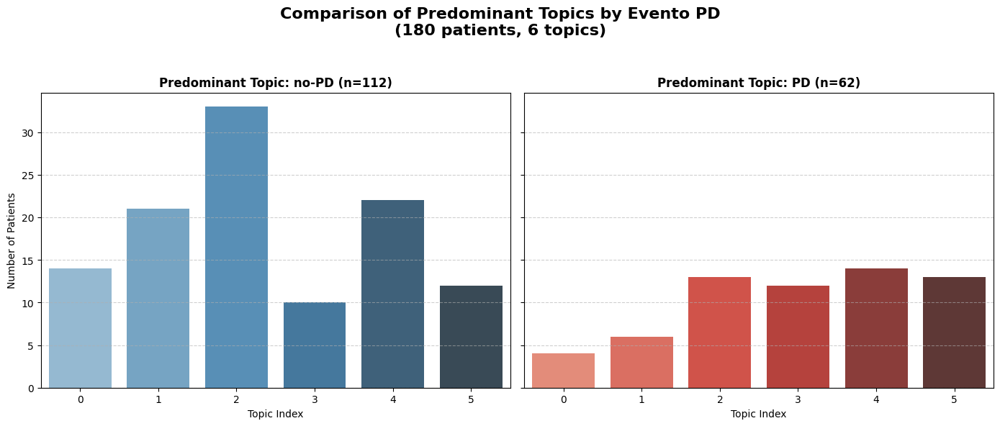

In [31]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

def plot_topics_by_event(df, event_col="Evento PD", n_topic=6, npatients=None, save_dir=None, filename="topics_by_event.png"):
    """
    Genera dos histogramas comparativos: la distribución de tópicos predominantes
    separada por el evento clínico (no-PD vs PD).
    """
    df = df.copy()
    
    # Aseguramos que el evento sea tratado como float para evitar errores de tipo
    df[event_col] = df[event_col].astype(float)
    
    # Dividimos el DataFrame según el evento
    df_event_0 = df[df[event_col] == 0.0]
    df_event_1 = df[df[event_col] == 1.0]

    # Configuramos la figura con dos subplots lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Gráfico para no-PD (Control)
    sns.countplot(data=df_event_0, x="predominant_topic", ax=axs[0], palette="Blues_d")
    axs[0].set_title(f"Predominant Topic: no-PD (n={len(df_event_0)})", fontsize=12, fontweight='bold')
    axs[0].set_xlabel("Topic Index")
    axs[0].set_ylabel("Number of Patients")
    axs[0].grid(axis='y', linestyle='--', alpha=0.6)

    # Gráfico para PD (Casos)
    sns.countplot(data=df_event_1, x="predominant_topic", ax=axs[1], palette="Reds_d")
    axs[1].set_title(f"Predominant Topic: PD (n={len(df_event_1)})", fontsize=12, fontweight='bold')
    axs[1].set_xlabel("Topic Index")
    axs[1].set_ylabel("") # Quitamos el label del eje Y porque está compartido
    axs[1].grid(axis='y', linestyle='--', alpha=0.6)

    # Título global dinámico
    title_main = f"Comparison of Predominant Topics by {event_col}"
    if npatients is not None:
        title_main += f"\n({npatients} patients, {n_topic} topics)"
    
    fig.suptitle(title_main, fontsize=16, fontweight="bold")

    plt.tight_layout(rect=[0, 0, 1, 0.94])

    # Guardado opcional
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✅ Gráfico comparativo guardado en: {save_path}")

    plt.show()

# --- Ejemplo de uso ---
plot_topics_by_event(
    df_unido, 
    event_col="Evento PD", 
    n_topic=6, 
    npatients=180
)

In [32]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

def plot_topics_by_event_and_cohort(df,n_topic=6, npatients=None, save_dir=None, filename="topics_by_event_and_cohort.png"):
    """
    Grid of histograms: distribution of predominant topics separated by Event (0=no-PD, 1=PD)
    and by Cohorte (each row = one cohort).
    """
    df = df.copy()
    df['Event_label'] = df['Event'].map({0: 'no-PD', 1: 'PD'})

    cohorts = sorted(df['Cohorte'].unique())
    events = ['no-PD', 'PD']

    n_rows = len(cohorts)
    n_cols = len(events)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), sharey=True)

    # If only one row/col, ensure axes is 2D
    if n_rows == 1:
        axes = [axes]
    if n_cols == 1:
        axes = [[ax] for ax in axes]

    for i, cohort in enumerate(cohorts):
        for j, event in enumerate(events):
            ax = axes[i][j]
            subset = df[(df['Cohorte'] == cohort) & (df['Event_label'] == event)]

            sns.countplot(data=subset, x="predominant_topic", ax=ax, palette="Set2")
            ax.set_title(f"Cohort: {cohort} | {event}", fontsize=11)
            ax.set_xlabel("Topic")
            if j == 0:
                ax.set_ylabel("Number of Patients")
            else:
                ax.set_ylabel("")

    # Global title
    if npatients is not None:
        fig.suptitle(f"Distribution of Predominant Topics by Event and Cohort ({npatients} patients, {n_topic} topics)",
                     fontsize=14, fontweight="bold")
    else:
        fig.suptitle("Distribution of Predominant Topics by Event and Cohort",
                     fontsize=14, fontweight="bold")

    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Save if directory is provided
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"Plot saved at: {save_path}")

    plt.show()


# Example usage
plot_topics_by_event_and_cohort(
    df_unido,
    n_topic=6,
    npatients=180,
    save_dir=os.path.join(module_path, "2nd_phase", "results", "topic_plots"),
    filename="topics_by_event_and_cohort_180p_6ldadic25.png"
)


KeyError: 'Event'

✅ Gráfico guardado en: /export/gts_usuarios/lparbaiza/cnio/2nd_phase/results/topic_plots/avg_topic_distribution_by_event_180p_6ldadic25.png


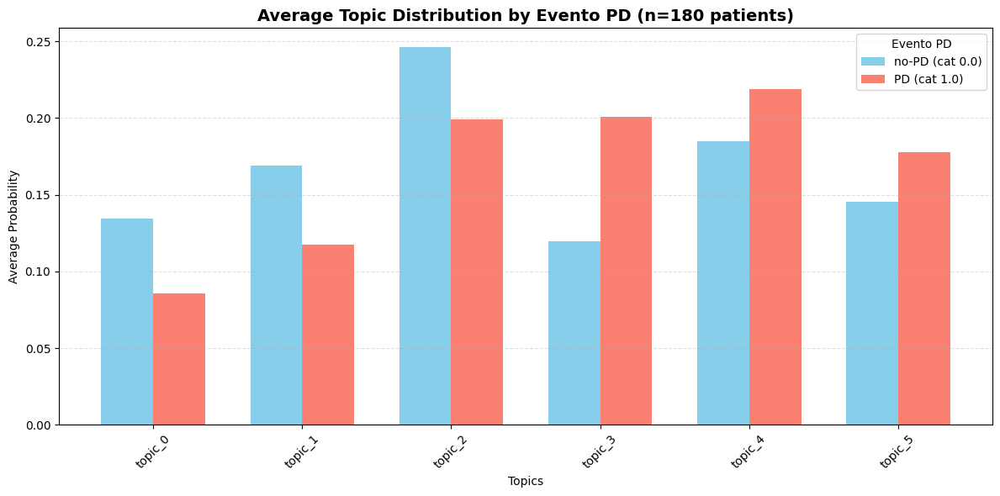

In [35]:
import os
import matplotlib.pyplot as plt
import numpy as np

def plot_avg_topic_distribution_by_event(df, topic_columns, group_col="Evento PD", n_topic=6, npatients=None, save_dir=None, filename="avg_topic_distribution.png", enriched=False):
    """
    Gráfico de barras de las distribuciones medias de tópicos separadas por la columna elegida (group_col).
    Normalmente compara PD (1.0) vs no-PD (0.0).
    """
    # 1. Agrupar por la columna elegida y calcular la media
    df_avg_topics = df.groupby(group_col)[topic_columns].mean()

    # 2. Identificar las categorías (ej: 0.0 y 1.0)
    categories = sorted(df_avg_topics.index.unique())
    
    # Posiciones en eje X
    x_pos = np.arange(len(topic_columns))
    plt.figure(figsize=(12, 6))
    bar_width = 0.35

    # 3. Dibujar las barras dinámicamente
    # Si tenemos al menos dos categorías, las graficamos comparadas
    colors = ['skyblue', 'salmon', 'lightgreen', 'orange'] # Paleta extendida por si hay más grupos
    
    for i, cat in enumerate(categories):
        offset = -bar_width/2 if i == 0 else bar_width/2
        label_text = f"no-PD (cat {cat})" if cat == 0 else f"PD (cat {cat})"
        
        # Si la columna no es binaria, usamos simplemente el nombre de la categoría
        if cat not in [0, 1, 0.0, 1.0]:
            label_text = f"Grupo: {cat}"

        plt.bar(x_pos + offset, df_avg_topics.loc[cat], width=bar_width,
                label=label_text, color=colors[i % len(colors)])

    # 4. Etiquetas y títulos dinámicos
    plt.xlabel('Topics')
    plt.ylabel('Average Probability')
    
    title_base = f'Average Topic Distribution by {group_col}'
    if enriched:
        title_base += f' ({n_topic} topics enriched)'
    
    if npatients is not None:
        title_base += f' (n={npatients} patients)'
        
    plt.title(title_base, fontsize=14, fontweight='bold')
    plt.xticks(x_pos, topic_columns, rotation=45)
    plt.legend(title=group_col)
    plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout()

    # 5. Guardar
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"✅ Gráfico guardado en: {save_path}")

    plt.show()

# --- Ejemplo de uso ---
# Puedes cambiar "Evento PD" por cualquier otra columna de tu Excel
plot_avg_topic_distribution_by_event(
    df_unido, 
    topic_columns=[f'topic_{i}' for i in range(6)], 
    group_col="Evento PD",  # <--- Aquí pones la columna que quieras
    n_topic=6,
    npatients=180,
    enriched=False,
    save_dir=os.path.join(module_path, "2nd_phase", "results", "topic_plots"),
    filename="avg_topic_distribution_by_event_180p_6ldadic25.png"
)

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

def plot_avg_topic_distribution_by_event(df, topic_columns, n_topic=6,
                                         npatients=None, save_dir=None,
                                         filename="avg_topic_distribution_by_event.png",
                                         enriched=False):
    """
    Barplot of average topic distributions separated by Event (0 = no-PD, 1 = PD).
    Cada barra representa la probabilidad media de un tópico en el grupo.
    """

    # --- 1. Calcular media de probabilidades por grupo de Event ---
    # Esto divide automáticamente entre el nº de pacientes en cada grupo
    df_avg_topics = df.groupby('Evento')[topic_columns].mean()

    # --- 2. Posiciones en el eje X ---
    x_pos = np.arange(len(topic_columns))

    # --- 3. Crear gráfico ---
    plt.figure(figsize=(10, 6))
    bar_width = 0.35

    # Barras para Event = 0 y Event = 1
    if 0 in df_avg_topics.index:
        plt.bar(x_pos - bar_width/2, df_avg_topics.loc[0],
                width=bar_width, label='no-PD (Event 0)', color='skyblue')
    if 1 in df_avg_topics.index:
        plt.bar(x_pos + bar_width/2, df_avg_topics.loc[1],
                width=bar_width, label='PD (Event 1)', color='salmon')

    # --- 4. Etiquetas y título dinámico ---
    plt.xlabel('Topic')
    plt.ylabel('Average Probability')
    if npatients is not None:
        if enriched:
            plt.title(f'Average Topic Distribution by Event (Soft topic assignement) '
                      f'({npatients} patients, {n_topic} topics enriched)')
        else:
            plt.title(f'Average Topic Distribution by Event (Soft topic assignement) '
                      f'({npatients} patients, {n_topic} topics)')
    else:
        plt.title('Average Topic Distribution by Event (PD vs no-PD)')

    plt.xticks(x_pos, topic_columns, rotation=45)
    plt.legend()
    plt.tight_layout()

    # --- 5. Guardar si se pide ---
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"Plot saved at: {save_path}")

    plt.show()


In [ ]:
plot_avg_topic_distribution_by_event(df_unido, topic_columns, n_topic=6,
                                         npatients=180)

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

def plot_avg_topic_distribution_by_event_and_cohort(df, topic_columns,n_topic=6, npatients=None,
                                                    save_dir=None, filename="avg_topic_distribution_by_event_and_cohort.png",enriched=False):
    """
    Barplots of average topic distributions separated by Event (0=no-PD, 1=PD) and by Cohorte.
    One subplot per cohort.
    """
    cohorts = sorted(df['Cohorte'].unique())
    n_cohorts = len(cohorts)

    # Create subplots: one row per cohort
    fig, axes = plt.subplots(n_cohorts, 1, figsize=(12, 4 * n_cohorts), sharex=True)

    # Ensure axes is iterable
    if n_cohorts == 1:
        axes = [axes]

    x_pos = np.arange(len(topic_columns))
    bar_width = 0.35

    for ax, cohort in zip(axes, cohorts):
        # Average topic distribution grouped by Event for this cohort
        df_avg_topics = df[df['Cohorte'] == cohort].groupby('Evento')[topic_columns].mean()

        # Bars for Event=0 and Event=1
        if 0 in df_avg_topics.index:
            ax.bar(x_pos - bar_width/2, df_avg_topics.loc[0], width=bar_width,
                   label="no-PD (Event 0)", color="skyblue")
        if 1 in df_avg_topics.index:
            ax.bar(x_pos + bar_width/2, df_avg_topics.loc[1], width=bar_width,
                   label="PD (Event 1)", color="salmon")

        ax.set_title(f"Cohort: {cohort}")
        ax.set_ylabel("Average Probability")
        ax.set_xticks(x_pos)
        ax.set_xticklabels(topic_columns, rotation=45)
        ax.legend()

    # Global title
    if npatients is not None:
        if enriched:
            fig.suptitle(f"Average Topic Distribution by Event and Cohort ({npatients} patients, {n_topic} topics enriched)",
                     fontsize=14, fontweight="bold")
        else:
            fig.suptitle(f"Average Topic Distribution by Event and Cohort ({npatients} patients, {n_topic} topics)",
                     fontsize=14, fontweight="bold")
    else:
        fig.suptitle("Average Topic Distribution by Event and Cohort",
                     fontsize=14, fontweight="bold")

    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Save if directory is provided
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)
        plt.savefig(save_path, dpi=300)
        print(f"Plot saved at: {save_path}")

    plt.show()


# Example usage
plot_avg_topic_distribution_by_event_and_cohort(
    df_unido,
    n_topic=6,
    topic_columns=topic_columns,
    npatients=180,
    enriched=True,
    #save_dir=os.path.join(module_path, "2nd_phase", "results", "topic_plots"),
    #filename="avg_topic_distribution_by_event_and_cohort_180p_6lda100000.png"
)


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Definimos los datos en el orden indicado
data = [
    [0,  'breast',     'CB',     0.20],
    [0,  'breast',     'no-CB',  0.00],
    [0,  'lung',       'CB',     0.12],
    [0,  'lung',       'no-CB',  0.75],
    [0,  'colorectal', 'CB',     0.15],
    [0,  'colorectal', 'no-CB',  0.00],

    [1,  'breast',     'CB',     0.27],
    [1,  'breast',     'no-CB',  0.75],
    [1,  'lung',       'CB',     0.25],
    [1,  'lung',       'no-CB',  0.13],
    [1,  'colorectal', 'CB',     0.25],
    [1,  'colorectal', 'no-CB',  0.00],

    [2,  'breast',     'CB',     0.13],
    [2,  'breast',     'no-CB',  0.00],
    [2,  'lung',       'CB',     0.05],
    [2,  'lung',       'no-CB',  0.00],
    [2,  'colorectal', 'CB',     0.00],
    [2,  'colorectal', 'no-CB',  0.00],

    [3,  'breast',     'CB',     0.06],
    [3,  'breast',     'no-CB',  0.14],
    [3,  'lung',       'CB',     0.15],
    [3,  'lung',       'no-CB',  0.00],
    [3,  'colorectal', 'CB',     0.00],
    [3,  'colorectal', 'no-CB',  0.27],

    [4,  'breast',     'CB',     0.18],
    [4,  'breast',     'no-CB',  0.00],
    [4,  'lung',       'CB',     0.20],
    [4,  'lung',       'no-CB',  0.70],
    [4,  'colorectal', 'CB',     0.15],
    [4,  'colorectal', 'no-CB',  0.00],

    [5,  'breast',     'CB',     0.10],
    [5,  'breast',     'no-CB',  0.00],
    [5,  'lung',       'CB',     0.20],
    [5,  'lung',       'no-CB',  0.00],
    [5,  'colorectal', 'CB',     0.30],
    [5,  'colorectal', 'no-CB',  0.68],
]

# Crear el DataFrame
df_probs = pd.DataFrame(data, columns=["Topic", "Cancer Type", "CB Status", "Probability"])

# Plot
plt.figure(figsize=(14, 6))
sns.barplot(data=df_probs, x="Cancer Type", y="Probability", hue="CB Status", errorbar=None,
            palette={"CB": "red", "no-CB": "blue"}, dodge=True)

# Dividir por tópico con FacetGrid
g = sns.catplot(
    data=df_probs,
    x="Cancer Type", y="Probability", hue="CB Status",
    col="Topic", kind="bar", palette={"CB": "red", "no-CB": "blue"},
    col_wrap=3, height=4, aspect=1
)

g.fig.suptitle("Probability of Cancer Type and CB Status per Topic", y=1.02, fontsize=16)
g.set_axis_labels("Cancer Type", "Probability")
g.set_titles("Topic {col_name}")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de probabilidades en el orden que mencionaste
probabilities = [
    # Topic 0
    0.2, 0, 0.12, 0.075, 0.15, 0,
    # Topic 1
    0.27, 0.75, 0.25, 0.13, 0.25, 0,
    # Topic 2
    0.13, 0, 0.05, 0, 0, 0,
    # Topic 3
    0.06, 0.14, 0.15, 0, 0, 0.27,
    # Topic 4
    0.18, 0, 0.2, 0.7, 0.15, 0,
    # Topic 5
    0.1, 0, 0.2, 0, 0.3, 0.68
]

topics = list(range(6))
cohorts = ["Breast", "Lung", "Colorectal"]
cb_statuses = ["CB", "no-CB"]

# Crear listas completas para cada columna
data = []
i = 0
for topic in topics:
    for cohort in cohorts:
        for cb in cb_statuses:
            data.append({
                "topic": topic,
                "Cohort": cohort,
                "CB Status": cb,
                "Probability": probabilities[i]
            })
            i += 1

df_probs = pd.DataFrame(data)

# Gráfico por topic
num_topics = df_probs["topic"].nunique()
n_cols = 3
n_rows = (num_topics + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows), sharey=True)
axes = axes.flatten()

# Paleta personalizada: CB en azul, no-CB en rojo
palette = {"CB": "blue", "no-CB": "red"}


    
for topic in sorted(df_probs["topic"].unique()):
    ax = axes[topic]
    subset = df_probs[df_probs["topic"] == topic]
    sns.barplot(data=subset, x="Cohort", y="Probability", hue="CB Status", ax=ax, palette=palette, errorbar=None)
    ax.set_title(f"Probabilities of RABP{topic+1} by Cancer Type and Clinical Evolution", fontsize=11)
    ax.set_xlabel("Cohort")
    ax.set_ylabel("Probability")
    ax.set_ylim(0, 1)
    ax.tick_params(axis='x', rotation=30)


# Eliminar subplots vacíos
for i in range(num_topics, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
